In [1]:
#load necessary libararies
import pandas as pd
import numpy as np
from sklearn.feature_selection import VarianceThreshold
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
import phik

import warnings
warnings.filterwarnings('ignore')

#### Importing Data


In [2]:
df=pd.read_csv('data_cleaned.csv')
pd.set_option('display.max_columns', None)
df.head()

,user_id,total_clicks,total_sessions,total_bags,total_hotel_spend,total_flights_spend,ads_per_km,recency,frequency,age,gender,married,has_children,total_cancellation,avg_session_time,total_num_of_flight_discount,total_flight_bookings,avg_flight_discount_amount,median_flight_discount_amount,mode_flight_discount_amount,max_flight_discount_amount,min_flight_discount_amount,total_num_of_hotel_discount,total_hotel_bookings,avg_hotel_discount_amount,median_hotel_discount_amount,mode_hotel_discount_amount,max_hotel_discount_amount,min_hotel_discount_amount,total_num_of_flight_discount_discarded,avg_flight_discount_amount_discarded,total_num_of_hotel_discount_discarded,avg_hotel_discount_amount_discarded,flight_discount_leads_to_hotel_booking,hotel_discount_leads_to_flight_booking,total_travelled_miles,flight_plus_hotels,home_country,home_city,home_airport,flights_with_bags_morethan_seats,flights_with_morethan_onebag,average_nights
0,94883,73,8,1,130,864.09,0.000000,109.0,4,51,F,1,0,0,67.750000,0.0,2.0,0.00,0.00,0.00,0.00,0.00,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,1.0,0.10,0.0,0.0,2902.670807,2,usa,kansas city,MCI,0.0,0.0,0.50
1,101486,131,8,0,2199,189.91,0.000000,41.0,3,50,F,1,1,0,122.250000,0.0,1.0,0.00,0.00,0.00,0.00,0.00,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.075,0.0,0.00,0.0,0.0,995.681600,1,usa,tacoma,TCM,0.0,0.0,4.00
2,101961,126,8,2,2429,1242.66,0.000727,36.0,10,43,F,1,0,0,117.750000,1.0,5.0,0.10,0.10,0.10,0.10,0.10,0.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,0.200,1.0,0.10,0.0,0.0,6832.845483,5,usa,boston,BOS,0.0,0.0,3.80
3,120851,55,8,0,2002,384.68,0.000000,112.0,2,51,F,1,1,0,51.750000,0.0,1.0,0.00,0.00,0.00,0.00,0.00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.225,0.0,0.00,0.0,0.0,2259.796668,1,usa,santa ana,SNA,0.0,0.0,11.00
4,125845,159,9,2,689,1753.32,0.012413,53.0,6,39,F,1,0,0,131.777778,1.0,3.0,0.15,0.15,0.15,0.15,0.15,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,1.0,0.05,0.0,0.0,8584.557386,3,usa,el paso,BIF,0.0,0.0,1.67


## EXPLOTARY ANALYSIS

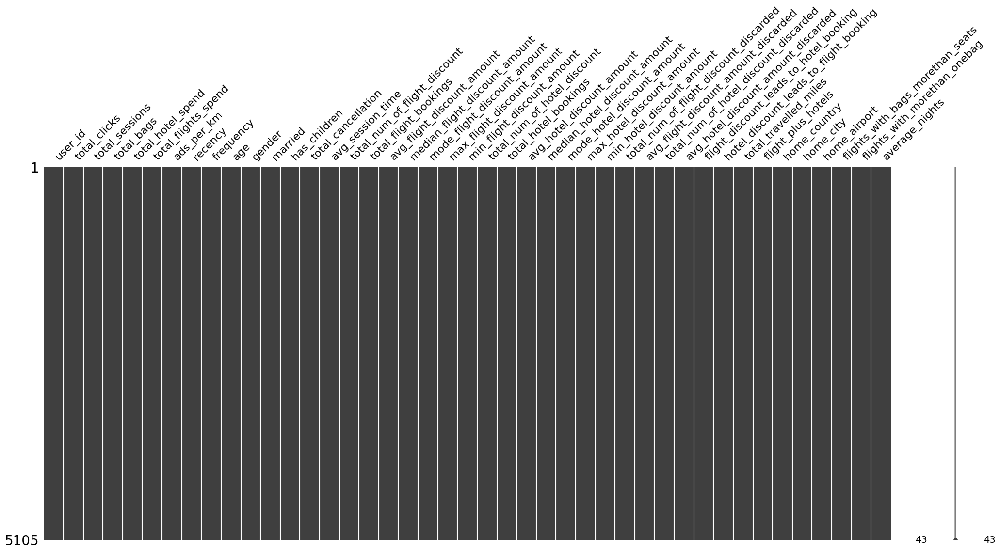

In [3]:
# Plot the nullity matrix
msno.matrix(df.iloc[:])
plt.show()

In [4]:
# Fill Nulls with zeros(as null represent clients with either no flight bookings , hotel bookings or clients with zero discount )
df.fillna(0,inplace=True)

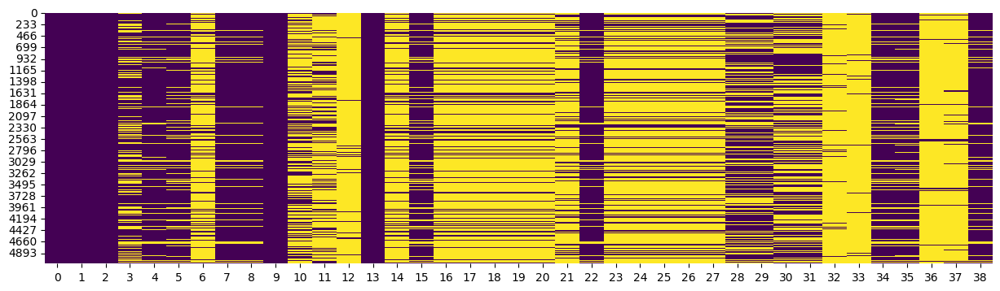

In [5]:
# Create a heatmap of zero values
plt.figure(figsize=(15,4))
sns.heatmap(np.isclose(df.select_dtypes(exclude='object'), 0, atol=0.0001), cmap='viridis', cbar=False)
plt.show()

###### It's normal to have a lot of zeroes in our features, as not all clients in this time period converted. Even if they did convert, they might have been interested in either of our services, such as flight booking or hotel booking, among others, resulting in zeros across the rest of the features.

### Summary Statistics

#### a- & Low Number Of Unique Values Features & Low Number Of Unique Values

In [6]:
# Statitics for feeatures with more than 10 unique values
df[[f for f in df.columns if df[f].nunique()>=10]].drop(columns='user_id').select_dtypes(exclude='object').describe()

,total_clicks,total_bags,total_hotel_spend,total_flights_spend,ads_per_km,recency,frequency,age,avg_session_time,avg_flight_discount_amount,median_flight_discount_amount,avg_hotel_discount_amount,median_hotel_discount_amount,avg_flight_discount_amount_discarded,avg_hotel_discount_amount_discarded,total_travelled_miles,average_nights
count,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000
mean,135.126347,1.211557,1728.451126,1028.546039,0.002110,72.207444,4.472086,41.059745,158.252174,0.023805,0.023786,0.020463,0.020451,0.094475,0.058507,4731.939400,3.335775
std,59.908926,1.208765,2067.930109,1138.885323,0.005861,55.211795,2.743554,12.371049,189.816336,0.052135,0.052111,0.043606,0.043563,0.088480,0.068785,4158.260727,2.980219
min,33.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,31.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,99.000000,0.000000,402.000000,313.910000,0.000000,23.000000,2.000000,34.000000,90.875000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1603.079962,1.500000
50%,124.000000,1.000000,1133.000000,797.380000,0.000000,61.000000,4.000000,41.000000,112.750000,0.000000,0.000000,0.000000,0.000000,0.100000,0.050000,4087.943811,2.670000
75%,153.000000,2.000000,2340.000000,1370.940000,0.000000,119.000000,6.000000,49.000000,140.500000,0.000000,0.000000,0.000000,0.000000,0.150000,0.100000,6834.603925,4.500000
max,642.000000,9.000000,28114.000000,15334.040000,0.088529,205.000000,14.000000,88.000000,2025.125000,0.300000,0.300000,0.250000,0.250000,0.550000,0.450000,33766.687846,30.000000


In [7]:
#Fix Type Error
df['total_hotel_spend']=np.abs(df['total_hotel_spend'])
df['average_nights']=np.abs(df['average_nights'])


In [8]:
def histogram_for_all_columns(dataframe, **kwargs):
    """
    Plot histograms for all columns in a dataframe.

    Parameters:
        dataframe: pandas DataFrame
            The dataframe containing the data.
        **kwargs:
            Additional keyword arguments to be passed to the histplot function in Seaborn.
            These could include parameters like 'stat', 'color', 'kde', etc.
    """
    num_columns = len(dataframe.columns)
    num_rows = int(num_columns / 3) + 1

    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))

    # Flatten the axes array if needed
    axes = axes.flatten()

    # Iterate over each column in the data frame
    for i, column in enumerate(dataframe.columns):
        # Create a histogram for the current column
        sns.histplot(data=dataframe, x=column, ax=axes[i], palette='tab10', **kwargs)
        axes[i].set_title(column)

        # If 'stat' is set to 'percent', add percentage annotations over the active bars
        if 'stat' in kwargs and kwargs['stat'] == 'percent':
            # Get the heights of the bars
            heights = [rect.get_height() for rect in axes[i].patches]

            # Filter out bars with zero height
            nonzero_heights = [height for height in heights if height > 0]

            # Add annotations over the nonzero-height bars
            for rect, height in zip(axes[i].patches, heights):
                if height in nonzero_heights:
                    axes[i].text(rect.get_x() + rect.get_width()/2, height, f'{height:.1f}%', ha='center', va='bottom')

    # Remove empty subplots
    if num_columns < len(axes):
        for j in range(num_columns, len(axes)):
            fig.delaxes(axes[j])

    # Adjust spacing between subplots
    fig.tight_layout()

    plt.show()

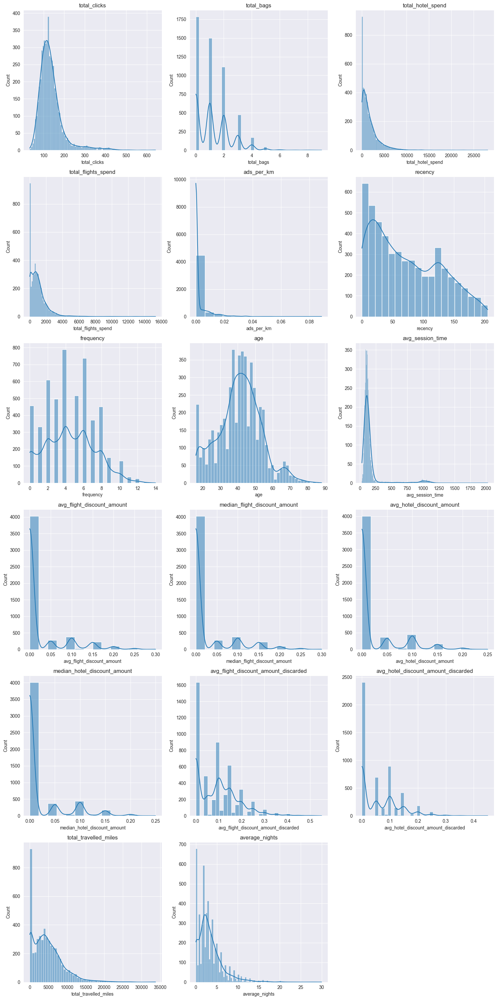

In [9]:
# Histogram for Countinous Data
sns.set_style('darkgrid')
histogram_for_all_columns(df[[f for f in df.columns if df[f].nunique()>=10]].drop(columns='user_id').select_dtypes(exclude='object'),kde=True,stat='count')

##### Notable Observations:
- The majority of our data exhibits a right-skewed distribution.
- Recent distribution analysis indicates a notable increase in demand, signaling business growth.
- Our client demographic predominantly falls within the age range of mid-thirties to mid-fifties.
- It's noteworthy that a portion of our clientele is not enticed by discounts.


#### b-Categorial & Low Number Of Unique Values Features 

In [10]:
# Statitics for feeatures with more than 10 unique values
df[[f for f in df.columns if df[f].nunique()<10]].drop(columns='home_country').describe()

,total_sessions,married,has_children,total_cancellation,total_num_of_flight_discount,total_flight_bookings,mode_flight_discount_amount,max_flight_discount_amount,min_flight_discount_amount,total_num_of_hotel_discount,total_hotel_bookings,mode_hotel_discount_amount,max_hotel_discount_amount,min_hotel_discount_amount,total_num_of_flight_discount_discarded,total_num_of_hotel_discount_discarded,flight_discount_leads_to_hotel_booking,hotel_discount_leads_to_flight_booking,flight_plus_hotels,flights_with_bags_morethan_seats,flights_with_morethan_onebag
count,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000
mean,8.186876,0.436827,0.321058,0.066405,0.233888,2.116748,0.022977,0.024672,0.022958,0.242116,2.222527,0.019755,0.021185,0.019755,1.074829,0.711459,0.048580,0.033301,1.843487,0.057982,0.086386
std,0.436779,0.496042,0.466929,0.252142,0.480566,1.431455,0.050796,0.054554,0.050747,0.490654,1.383910,0.042271,0.045885,0.042271,0.969703,0.800908,0.223059,0.182684,1.359250,0.237887,0.290559
min,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,8.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000
75%,8.000000,1.000000,1.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000,3.000000,0.000000,0.000000
max,12.000000,1.000000,1.000000,2.000000,4.000000,7.000000,0.300000,0.350000,0.300000,4.000000,8.000000,0.250000,0.450000,0.250000,6.000000,5.000000,2.000000,2.000000,6.000000,2.000000,2.000000


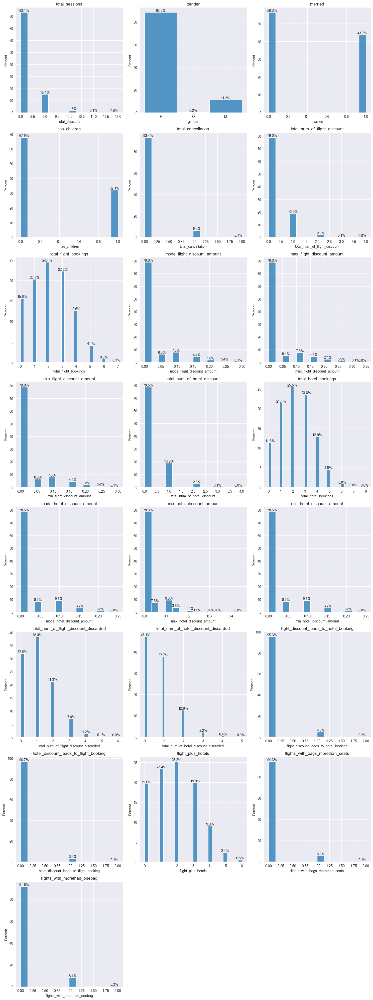

In [11]:
# Bar Plot for feeatures with more than 10 unique values
histogram_for_all_columns(df[[f for f in df.columns if df[f].nunique()<10]].drop(columns='home_country'),stat='percent')

##### Notable Observations:

- Nearly 88.5% of our clients are females (the most).
- 43.7% of our clients are married.
- 32.1% of our clients have children.
- 6.5% of sessions are cancelled.
- The most frequent discounts are 10% and 5% respectively.
- Some discounts lead to the opposite service (it was a successful attraction element for some users).
- 80% of our clients reserved a hotel plus flight at least once, and 47% twice.
- About 5.6% of clients have a ratio over 1 for the number of bags to the number of seats.
- 8.1% of our clients have more than one bag per flight.

### Geographic Analysis

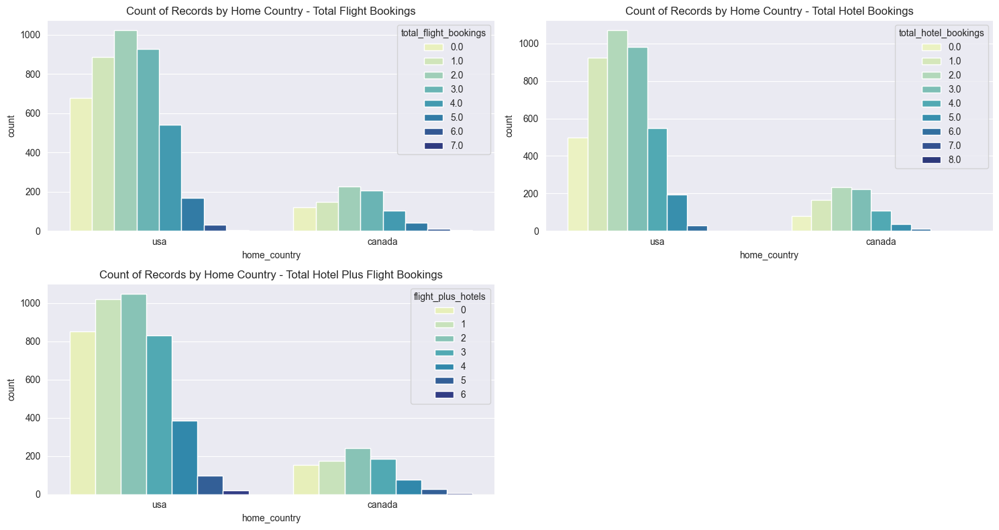

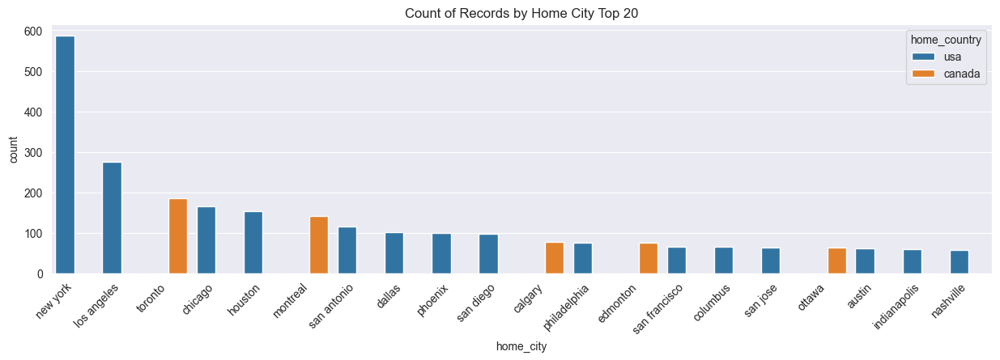

In [12]:
#country and city on user level analysis
# Set the figure size
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')
# Subplot 1: Count Plot for Home Country - Total Flight Bookings
plt.subplot(2, 2, 1)
sns.countplot(x='home_country', hue='total_flight_bookings', palette='YlGnBu', data=df)
plt.title('Count of Records by Home Country - Total Flight Bookings')

# Subplot 2: Count Plot for Home Country - Total Hotel Bookings
plt.subplot(2, 2, 2)
sns.countplot(x='home_country', hue='total_hotel_bookings', palette='YlGnBu', data=df)
plt.title('Count of Records by Home Country - Total Hotel Bookings')

# Subplot 3: Count Plot for Home Country - Total Hotel Plus Flight Bookings
plt.subplot(2, 2, 3)
sns.countplot(x='home_country', hue='flight_plus_hotels', palette='YlGnBu', data=df)
plt.title('Count of Records by Home Country - Total Hotel Plus Flight Bookings')


# Adjust layout to prevent overlapping
plt.tight_layout()

plt.show()

# Set the figure size for the next plot
plt.figure(figsize=(15, 4))

# Count Plot for Home City with stacked bars for flight and hotel counts
sns.countplot(x='home_city', order=df['home_city'].value_counts().index[:20],data=df,hue='home_country')
plt.title('Count of Records by Home City Top 20')
plt.xticks(rotation=45,ha='right')
plt.show()

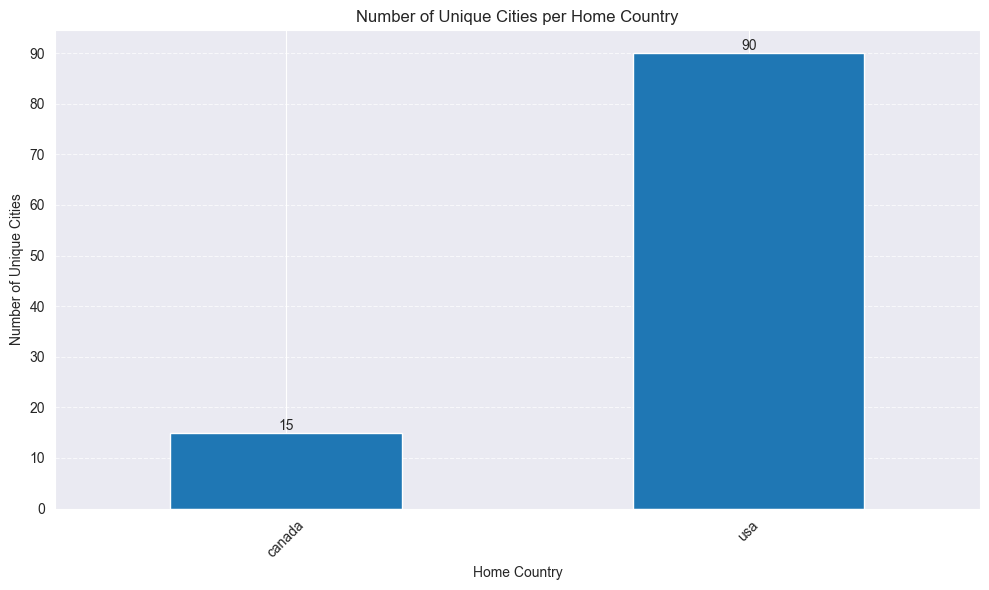

In [13]:
# Group by 'home_country' and count the number of unique cities
unique_cities_per_country = df.groupby('home_country')['home_city'].nunique()

plt.figure(figsize=(10, 6))
ax = unique_cities_per_country.plot(kind='bar')
plt.title('Number of Unique Cities per Home Country')
plt.xlabel('Home Country')
plt.ylabel('Number of Unique Cities')
plt.xticks(rotation=45)
plt.yticks(np.arange(0, 100, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add values on top of the bars
for i in ax.patches:
    plt.text(i.get_x() + i.get_width() / 2, i.get_height(), str(i.get_height()), ha='center', va='bottom')



plt.tight_layout()
plt.show()

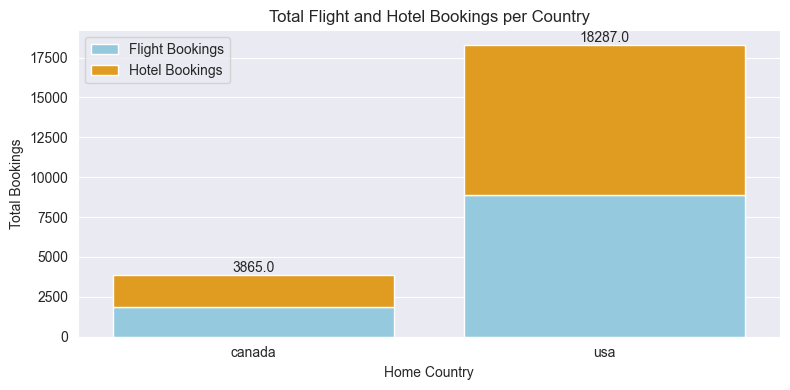

In [14]:
# Calculate the sum of total flight and hotel bookings per country
total_bookings_per_country = df.groupby('home_country')[['total_flight_bookings', 'total_hotel_bookings']].sum().reset_index()

# Set the figure size
plt.figure(figsize=(8, 4))

# Stacked bar plot for total flight and hotel bookings per country
sns.barplot(x='home_country', y='total_flight_bookings', data=total_bookings_per_country, label='Flight Bookings', color='skyblue')
bottom_bar = sns.barplot(x='home_country', y='total_hotel_bookings', data=total_bookings_per_country, label='Hotel Bookings', color='orange', bottom=total_bookings_per_country['total_flight_bookings'])

# Add values on top of the bars
for index, row in total_bookings_per_country.iterrows():
    plt.text(index, row['total_flight_bookings'] + row['total_hotel_bookings'] + 5, f"{row['total_flight_bookings'] + row['total_hotel_bookings']}",
             ha='center', va='bottom', fontsize=10)

# Customize plot
plt.title('Total Flight and Hotel Bookings per Country')
plt.xlabel('Home Country')
plt.ylabel('Total Bookings')
plt.legend()

plt.tight_layout()
plt.show()

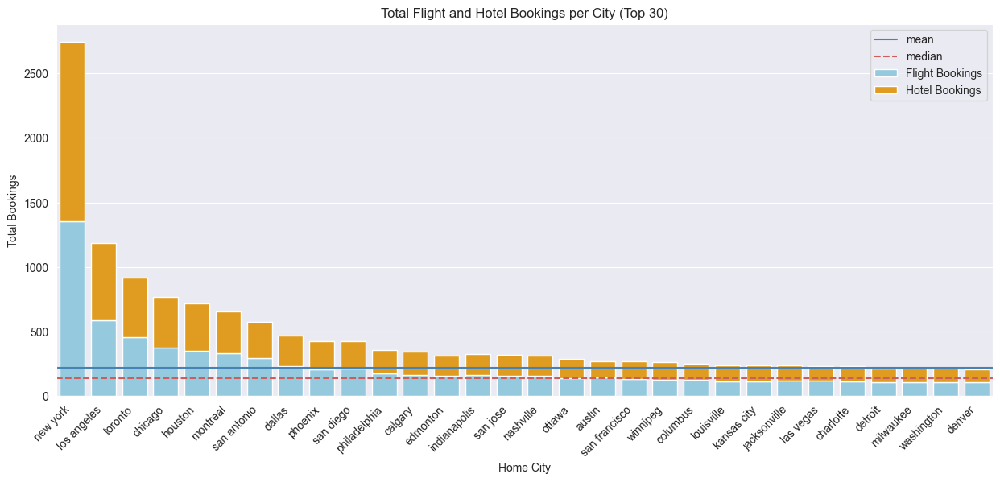

In [15]:

# Calculate total bookings per city, including overall bookings directly
total_bookings_per_city = (
    df.groupby(['home_city'])
    .agg(
        total_flight_bookings=('total_flight_bookings', 'sum'),
        total_hotel_bookings=('total_hotel_bookings', 'sum'),
        overall_bookings=('frequency', 'sum'),
    )
    .reset_index()
)

# Select the top 20 cities and create a stacked bar plot using pandas
top_cities_records = total_bookings_per_city.sort_values(by='overall_bookings', ascending=False).head(30)
# Set the figure size
plt.figure(figsize=(15, 6))

# Stacked bar plot for total flight and hotel bookings per city
sns.barplot(x='home_city', y='total_flight_bookings', data=top_cities_records, label='Flight Bookings', color='skyblue')
sns.barplot(x='home_city', y='total_hotel_bookings', data=top_cities_records, label='Hotel Bookings', color='orange', bottom=top_cities_records['total_flight_bookings'])

# Customize plot
plt.axhline(total_bookings_per_city['overall_bookings'].mean(),linestyle='-', label='mean',color='steelblue')
plt.axhline(total_bookings_per_city['overall_bookings'].median(),linestyle='--', label='median',color='indianred')
plt.title('Total Flight and Hotel Bookings per City (Top 30)')
plt.xlabel('Home City')
plt.ylabel('Total Bookings')
plt.legend()
plt.xticks(rotation=45, ha='right')  # Adjust rotation for better readability
plt.show()


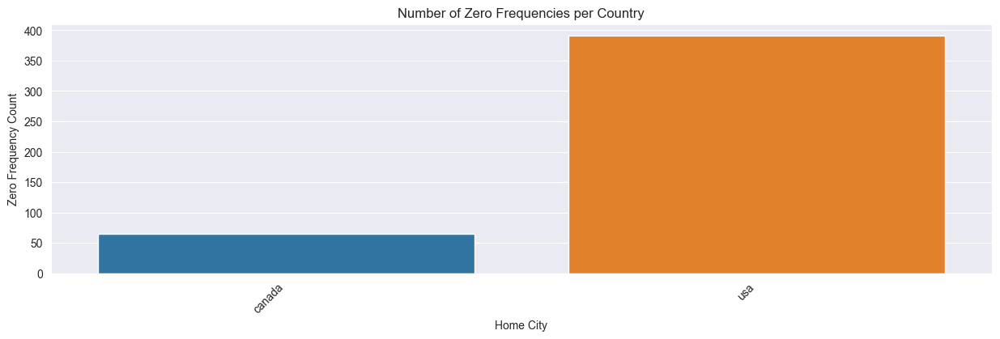

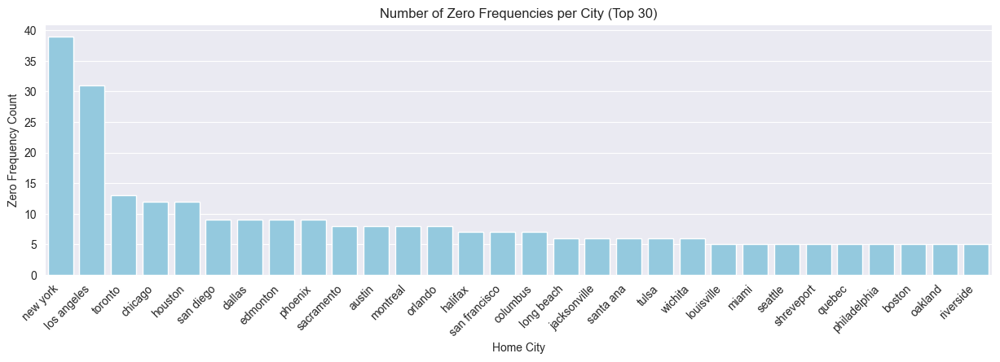

In [16]:
# Unconverted users on Country level
# Filter rows where frequency is zero
zero_frequency = df[df['frequency'] == 0]

# Calculate the count of zero frequencies per Country
zero_frequency_counts = zero_frequency.groupby('home_country').size().reset_index(name='zero_frequency_count')

# Set the figure size
plt.figure(figsize=(15, 4))

# Bar plot for the number of zero frequencies per city
sns.barplot(x='home_country', y='zero_frequency_count', data=zero_frequency_counts)

# Customize plot
plt.title('Number of Zero Frequencies per Country')
plt.xlabel('Home City')
plt.ylabel('Zero Frequency Count')
plt.xticks(rotation=45, ha='right')  # Adjust rotation for better readability
plt.show()

# Unconverted users on city level

# Calculate the count of zero frequencies per city
zero_frequency_counts = zero_frequency.groupby('home_city').size().reset_index(name='zero_frequency_count')

# Select the top 30 cities with the most zero frequencies
top_zero_frequency_cities = zero_frequency_counts.sort_values(by='zero_frequency_count', ascending=False).head(30)

# Set the figure size
plt.figure(figsize=(15, 4))

# Bar plot for the number of zero frequencies per city
sns.barplot(x='home_city', y='zero_frequency_count', data=top_zero_frequency_cities, color='skyblue')

# Customize plot
plt.title('Number of Zero Frequencies per City (Top 30)')
plt.xlabel('Home City')
plt.ylabel('Zero Frequency Count')
plt.xticks(rotation=45, ha='right')  # Adjust rotation for better readability
plt.show()

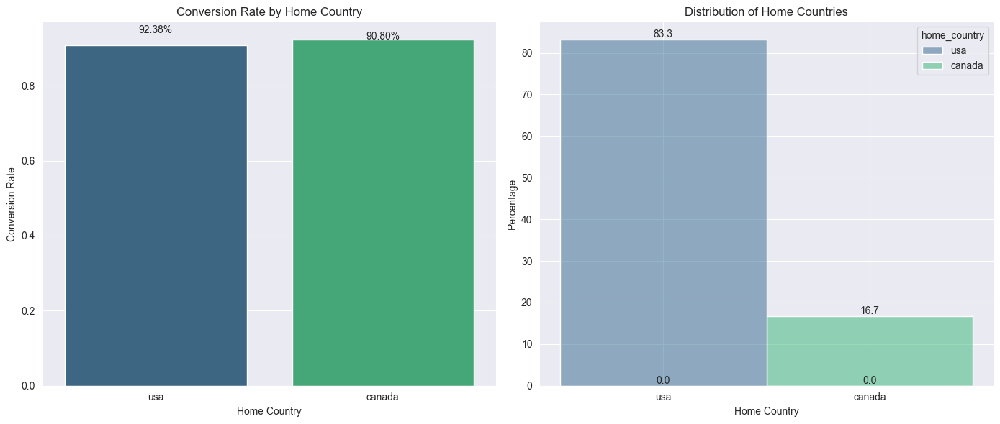

In [17]:
# Calculate the ratio
ratio_series = df[df['frequency'] > 0].groupby('home_country')['home_country'].count() / df.groupby('home_country')['home_country'].count()

# Convert the series to a DataFrame for plotting
ratio_df = ratio_series.reset_index(name='ratio')

# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot the first graph (bar plot with annotations)
sns.barplot(x='home_country', y='ratio', data=ratio_df, order=['usa','canada'],palette='viridis', ax=axs[0])
axs[0].set_title('Conversion Rate by Home Country')
axs[0].set_xlabel('Home Country')
axs[0].set_ylabel('Conversion Rate')

# Add annotations with the actual numerical ratios on each bar
for index, value in enumerate(ratio_df['ratio']):
    axs[0].text(index, value + 0.01, f'{value:.2%}', ha='center', va='bottom', fontsize=10)

# Plot the second graph (histogram)
sns.histplot(df, x='home_country', stat='percent',hue='home_country',palette='viridis', ax=axs[1])
axs[1].set_title('Distribution of Home Countries')
axs[1].set_xlabel('Home Country')
axs[1].set_ylabel('Percentage')

# Add values on top of the bars in the histogram
for index, p in enumerate(axs[1].patches):
    axs[1].annotate(format(p.get_height(), '.1f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom',  
                    fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the combined plot
plt.show()

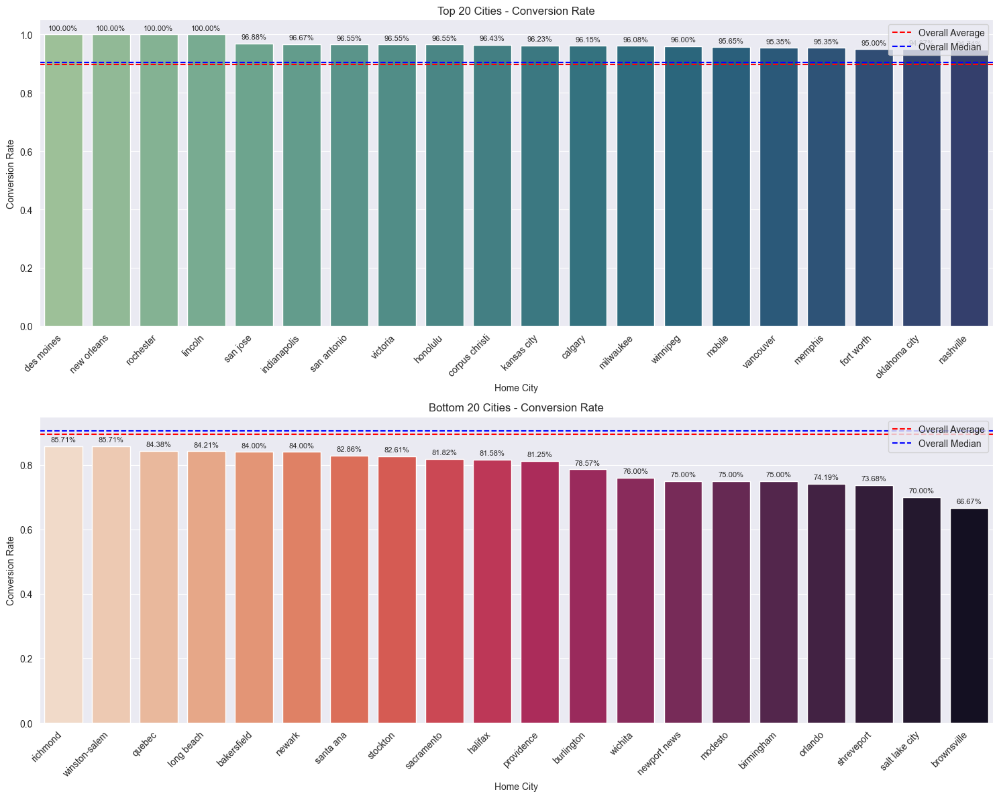

In [18]:

# Calculate the ratio for home_city
ratio_city = df[df['frequency'] > 0].groupby('home_city')['home_city'].count() / df.groupby('home_city')['home_city'].count()
ratio_df_city = ratio_city.reset_index(name='ratio_city')

# Sort by frequency ratio
sorted_ratio_df_city = ratio_df_city.sort_values(by='ratio_city', ascending=False)

# Divide the top and bottom 20 cities
top_cities = sorted_ratio_df_city.nlargest(20, 'ratio_city')
bottom_cities = sorted_ratio_df_city.nsmallest(20, 'ratio_city').sort_values(by='ratio_city', ascending=False)

# Calculate overall average and median
overall_average = ratio_df_city['ratio_city'].mean()
overall_median = ratio_df_city['ratio_city'].median()

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 12))

# Plot for top 30 cities
sns.barplot(x='home_city', y='ratio_city', data=top_cities, palette='crest', ax=axes[0])
axes[0].set_title('Top 20 Cities - Conversion Rate')
axes[0].set_xlabel('Home City')
axes[0].set_ylabel('Conversion Rate')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')  # Rotate x-axis ticks
axes[0].axhline(overall_average, color='r', linestyle='--', label='Overall Average')
axes[0].axhline(overall_median, color='b', linestyle='--', label='Overall Median')

# Add annotations with the actual numerical ratios on each bar
for index, value in enumerate(top_cities['ratio_city']):
    axes[0].text(index, value + 0.01, f'{value:.2%}', ha='center', va='bottom', fontsize=8)

# Plot for bottom 30 cities
sns.barplot(x='home_city', y='ratio_city', data=bottom_cities, palette='rocket_r', ax=axes[1])
axes[1].set_title('Bottom 20 Cities - Conversion Rate')
axes[1].set_xlabel('Home City')
axes[1].set_ylabel('Conversion Rate')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')  # Rotate x-axis ticks
axes[1].axhline(overall_average, color='r', linestyle='--', label='Overall Average')
axes[1].axhline(overall_median, color='b', linestyle='--', label='Overall Median')

# Add annotations with the actual numerical ratios on each bar
for index, value in enumerate(bottom_cities['ratio_city']):
    axes[1].text(index, value + 0.01, f'{value:.2%}', ha='center', va='bottom', fontsize=8)

axes[0].legend(loc='upper right')
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

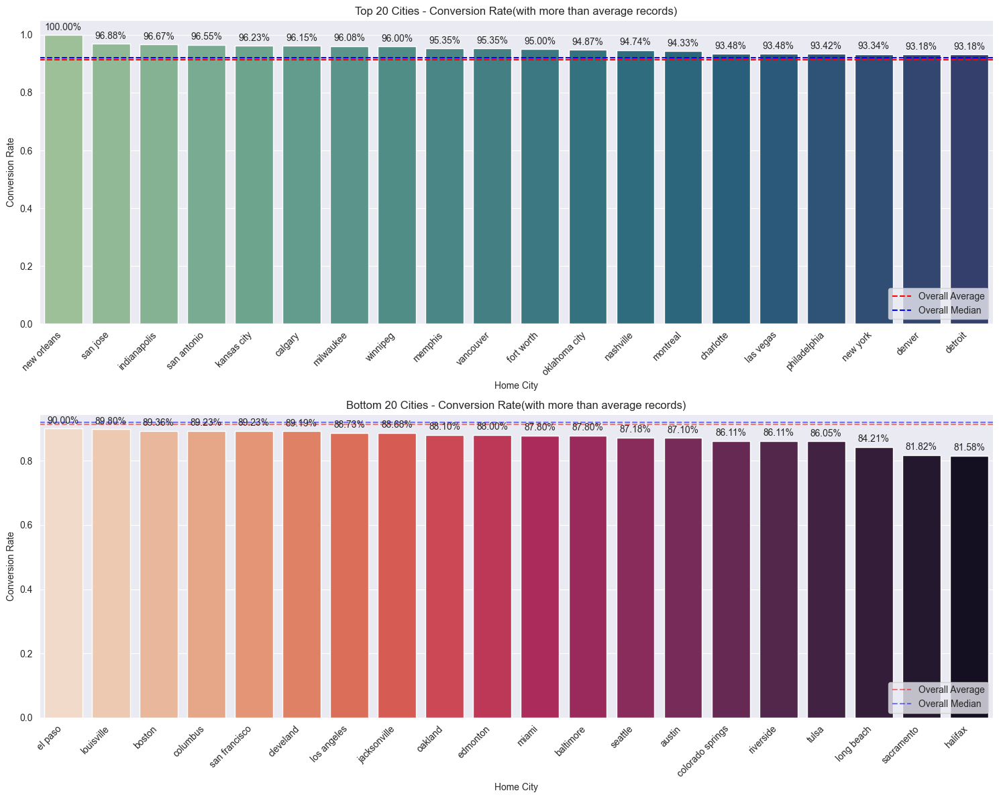

In [19]:
# Filter the DataFrame to include only cities with above-median counts
filtered_df = df[df['home_city'].isin(df['home_city'].value_counts()[df['home_city'].value_counts() > df['home_city'].value_counts().median()].index)]

# Calculate the ratio for home_city
ratio_city = filtered_df[filtered_df['frequency'] > 0].groupby('home_city')['home_city'].count() / filtered_df.groupby('home_city')['home_city'].count()
ratio_df_city = ratio_city.reset_index(name='ratio_city')

# Sort by frequency ratio
sorted_ratio_df_city = ratio_df_city.sort_values(by='ratio_city', ascending=False)

# Divide the top and bottom 20 cities
top_cities_above_median = sorted_ratio_df_city.nlargest(20, 'ratio_city')
bottom_cities_above_median = sorted_ratio_df_city.nsmallest(20, 'ratio_city').sort_values(by='ratio_city', ascending=False)

# Calculate overall average and median
overall_average = ratio_df_city['ratio_city'].mean()
overall_median = ratio_df_city['ratio_city'].median()

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 12))

# Plot for top 30 cities
sns.barplot(x='home_city', y='ratio_city', data=top_cities_above_median, palette='crest', ax=axes[0])
axes[0].set_title('Top 20 Cities - Conversion Rate(with more than average records)')
axes[0].set_xlabel('Home City')
axes[0].set_ylabel('Conversion Rate')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')  # Rotate x-axis ticks
axes[0].axhline(overall_average, color='r', linestyle='--', label='Overall Average')
axes[0].axhline(overall_median, color='b', linestyle='--', label='Overall Median')

# Add annotations with the actual numerical ratios on each bar
for index, value in enumerate(top_cities_above_median['ratio_city']):
    axes[0].text(index, value + 0.01, f'{value:.2%}', ha='center', va='bottom', fontsize=10)

# Plot for bottom 30 cities
sns.barplot(x='home_city', y='ratio_city', data=bottom_cities_above_median, palette='rocket_r', ax=axes[1])
axes[1].set_title('Bottom 20 Cities - Conversion Rate(with more than average records)')
axes[1].set_xlabel('Home City')
axes[1].set_ylabel('Conversion Rate')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')  # Rotate x-axis ticks
axes[1].axhline(overall_average, color='r', linestyle='--', label='Overall Average',alpha=.5)
axes[1].axhline(overall_median, color='b', linestyle='--', label='Overall Median',alpha=.5)

# Add annotations with the actual numerical ratios on each bar
for index, value in enumerate(bottom_cities_above_median['ratio_city']):
    axes[1].text(index, value + 0.01, f'{value:.2%}', ha='center', va='bottom', fontsize=10)

axes[0].legend(loc='lower right')
axes[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

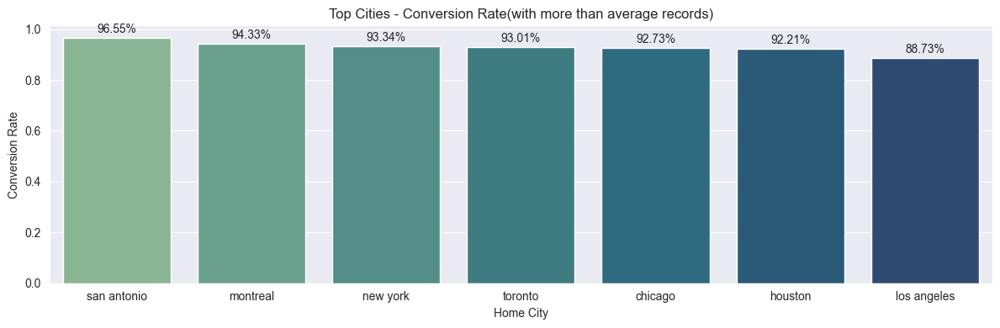

In [20]:
# top cities with more than 500 bookings
filtered_df_top = df[df['home_city'].isin(df.groupby('home_city')['frequency'].sum()[df.groupby('home_city')['frequency'].sum() > 500].index)]
top_freq_cities=sorted_ratio_df_city[sorted_ratio_df_city['home_city'].isin(filtered_df_top.home_city)]
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))


sns.barplot(x='home_city', y='ratio_city', data=top_freq_cities, palette='crest')
axes.set_title('Top Cities - Conversion Rate(with more than average records)')
axes.set_xlabel('Home City')
axes.set_ylabel('Conversion Rate')

# Add annotations with the actual numerical ratios on each bar
for index, value in enumerate(top_freq_cities['ratio_city']):
    axes.text(index, value + 0.01, f'{value:.2%}', ha='center', va='bottom', fontsize=10)


plt.tight_layout()
plt.show()

##### Notable Observations:

- 83.3% of our clients are from the USA and 16.7% are from Canada. 
- We have 18,287 bookings from the USA and 3,865 from Canada. 
- We are active in 90 different states in America and 15 cities in Canada. 
- New York and Los Angeles are the cities with the highest number of clients in America. 
- Toronto and Montreal are the cities with the highest number of clients in Canada. 
- America has a conversion rate of 90.8%, while Canada has a conversion rate of 92.38%. 
- Des Moines, New Orleans, Rochester, and Lincoln have perfect conversion rates. 
- Brownsville, Salt Lake City, Shreveport, Orlando, Birmingham, Modesto, Newport News, Wichita, and Burlington have a conversion rate below 80%. 
- After filtering the data to include only cities with above-median records (the median is used here to avoid bias), /we found that only New Orleans has a perfect conversion rate, and Halifax, Sacramento, and Long Beach have a conversion rate below 85%. 
- Among cities with more than 500 bookings, San Antonio has the highest conversion rate, while Los Angeles has the lowest.

### Behavoir & Demographic Analysis 

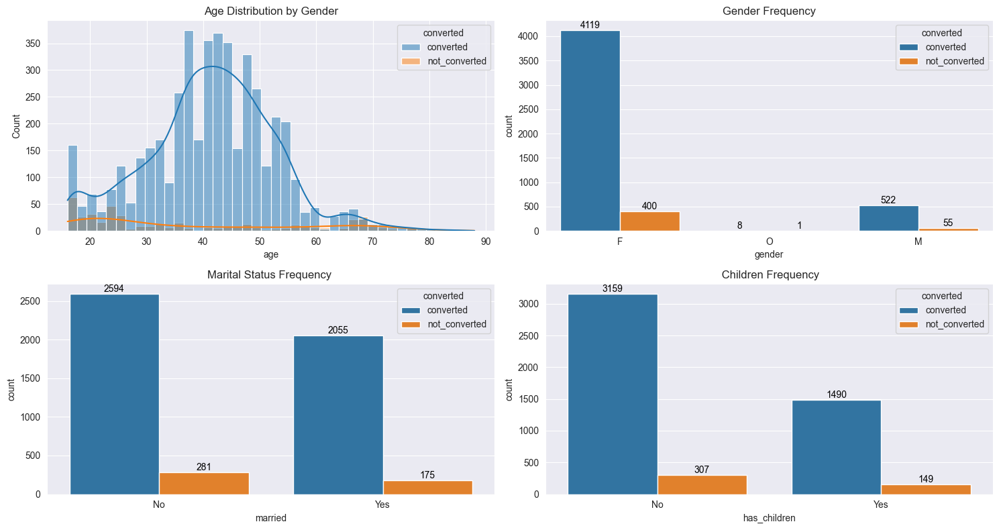

In [21]:
# General Demogarphic Analysis
df['converted']=np.where(df['frequency']>0,'converted','not_converted')
# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 8))

# Plot histograms for each column
sns.histplot(x=df['age'], hue=df['converted'],stat='count', ax=axes[0, 0],kde=True)
axes[0, 0].set_title('Age Distribution by Gender')

sns.countplot(x=df['gender'],hue=df['converted'], ax=axes[0, 1])
axes[0, 1].set_title('Gender Frequency')

sns.countplot(x=df['married'],hue=df['converted'], ax=axes[1, 0])
axes[1, 0].set_title('Marital Status Frequency ')
axes[1, 0].set_xticklabels(['No','Yes'])

sns.countplot(x=df['has_children'],hue=df['converted'], ax=axes[1, 1])
axes[1, 1].set_title(' Children Frequency')
axes[1, 1].set_xticklabels(['No','Yes'])


# Add values over the bars
for ax in [axes[0, 1], axes[1, 0], axes[1, 1]]:
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2., p.get_height(), '%d' % int(p.get_height()), 
                ha='center', va='bottom', fontsize=10, color='black')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

##### Notable Observations:

- The age distribution reveals that individuals below their thirties and those above their sixties exhibit lower conversion rates. However, the majority of our clients fall within the age range of 30 to 55.
- Approximately 88.5 percent of our clients identify as females, boasting a conversion rate of nearly 90 percent.
- Conversely, around 11.5 percent of our clients identify as males, with a similar conversion rate of nearly 90 percent.
- Roughly 44 percent of our clients are married.
- Additionally, one-third of our clients are parents.


In [22]:
df.columns

Index(['user_id', 'total_clicks', 'total_sessions', 'total_bags',
       'total_hotel_spend', 'total_flights_spend', 'ads_per_km', 'recency',
       'frequency', 'age', 'gender', 'married', 'has_children',
       'total_cancellation', 'avg_session_time',
       'total_num_of_flight_discount', 'total_flight_bookings',
       'avg_flight_discount_amount', 'median_flight_discount_amount',
       'mode_flight_discount_amount', 'max_flight_discount_amount',
       'min_flight_discount_amount', 'total_num_of_hotel_discount',
       'total_hotel_bookings', 'avg_hotel_discount_amount',
       'median_hotel_discount_amount', 'mode_hotel_discount_amount',
       'max_hotel_discount_amount', 'min_hotel_discount_amount',
       'total_num_of_flight_discount_discarded',
       'avg_flight_discount_amount_discarded',
       'total_num_of_hotel_discount_discarded',
       'avg_hotel_discount_amount_discarded',
       'flight_discount_leads_to_hotel_booking',
       'hotel_discount_leads_to_flight_boo

In [23]:
behavioral_features = [
    'total_clicks',
    'total_sessions',
    'total_bags',
    'total_hotel_spend',
    'total_flights_spend',
    'recency',
    'frequency',
    'total_cancellation',
    'avg_session_time',
    'total_num_of_flight_discount',
    'total_num_of_hotel_discount',
    'total_num_of_flight_discount_discarded',
    'avg_flight_discount_amount_discarded',
    'total_num_of_hotel_discount_discarded',
    'avg_hotel_discount_amount_discarded',
    'flight_discount_leads_to_hotel_booking',
    'hotel_discount_leads_to_flight_booking',
    'total_travelled_miles',
    'flight_plus_hotels',
    'flights_with_bags_morethan_seats',
    'flights_with_morethan_onebag',
    'average_nights'

]

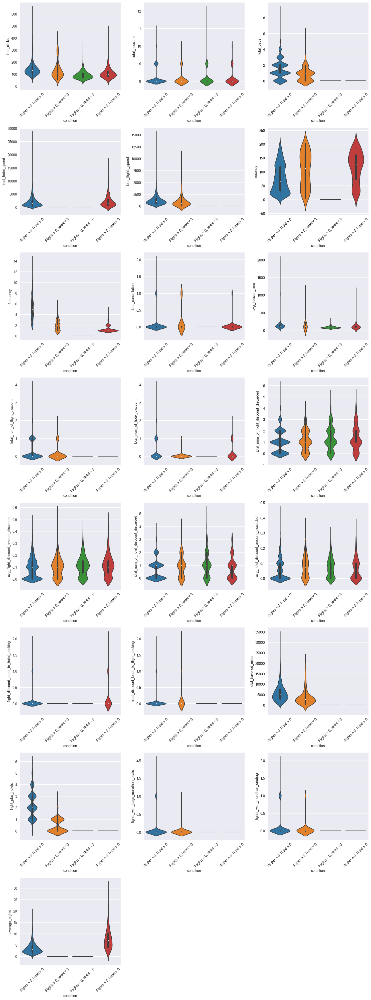

In [24]:
# Create a new column 'condition' based on spending criteria
df['condition'] = np.where(
    (df['total_flights_spend'] == 0) & (df['total_hotel_spend'] == 0),
    'Flights = 0, Hotel = 0',
    np.where(
        (df['total_flights_spend'] > 0) & (df['total_hotel_spend'] > 0),
        'Flights > 0, Hotel > 0',
        np.where(
            (df['total_flights_spend'] > 0) & (df['total_hotel_spend'] == 0),
            'Flights > 0, Hotel = 0',
            'Flights = 0, Hotel > 0',
        )
    )
)
num_columns = len(behavioral_features)
num_rows = int(num_columns / 3) + 1

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))

for i, col in enumerate(df[behavioral_features].columns):
    row_index = i // 3
    col_index = i % 3
    if row_index < num_rows:  # Ensure we're within the bounds of the subplot grid
        sns.violinplot(data=df, x='condition', y=col, ax=axes[row_index, col_index])
        axes[row_index, col_index].tick_params(axis='x', rotation=45) # Rotate x-ticks
        

fig.delaxes(ax=axes[7,2])
fig.delaxes(ax=axes[7,1])

plt.tight_layout()
plt.show()

##### Notable Observations:

- Clients with an interest in both flights and hotels exhibit a higher click rate. Those who exclusively purchase flights demonstrate a higher click rate compared to those exclusively purchasing hotels, while the distribution of clicks for unconverted clients closely resembles that of individuals who solely purchase hotels.

- Clients interested in both hotels and flights tend to have a higher total number of bags, despite having the same median. <small> This could be due to the fact that while the median represents the middle value of the data set, it doesn't account for the distribution of bags among clients. Therefore, clients interested in both hotels and flights might have a wider range of bag counts, resulting in a higher total number of bags overall, even though the median remains the same.</small>

- Clients with an interest in hotels only spend slightly more on hotels compared to clients with an interest in both flights and hotels. <small>This suggests that individuals who are solely interested in hotel bookings tend to allocate a slightly higher portion of their spending towards hotel accommodations compared to those who are interested in both flights and hotels. This could be due to their prioritization of hotel expenses over other travel-related costs.</small>

- Conversely, clients with an interest in flights only spend less on flights than clients with an interest in both flights and hotels. <small>This implies that individuals who exclusively focus on booking flights allocate less of their expenditure towards air travel compared to those who have an interest in both flights and hotels. This discrepancy may occur because individuals with dual interests are likely to invest more in their overall travel experience, including both flights and accommodations, whereas those interested only in flights may have a narrower focus on minimizing costs associated with air travel.</small>

- Recency indicates higher activity among clients interested in both flights and hotels compared to those interested in only flights or only hotels, although clients interested solely in hotels exhibit slightly less activity than those interested only in flights.

- Clients interested in both flights and hotels exhibit a notably higher frequency compared to those interested solely in flights or hotels, whereas clients interested exclusively in hotels display a notably lower frequency compared to those interested solely in flights.

- Total cancellations show no notable discrepancy between the groups.

- Clients with no purchasing activity have the lowest average session times, while clients with an interest in both hotels and flights have the highest.

- Clients with an interest in both flights and hotels have a higher number of flight discounts compared to other groups.

- Most data for all groups in the number of hotel discounts are around zero, with higher extremes observed in clients with both interests in flights and hotels. However, it's worth noting that although a small group of clients with no hotel purchasing has discount offers, it seems these offers are not converted into active purchasing.

- There are more discarded flight discounts compared to hotel discounts, although the median of the average discarded flight discounts is higher. This may indicate a greater interest in hotel discounts among clients.

- Clients with interests in both hotels and flights have traveled more miles than those with interests solely in flights.

- Some clients who reserved both flights and hotels have discarded the hotel reservation and kept only the flight reservation.

- Most clients have a lower ratio of bags to reserved seats.

- Clients with only interest in hotels have almost double the median of average nights reserved in hotels compared to clients with interests in both flights and hotels.

##### i-Country Level

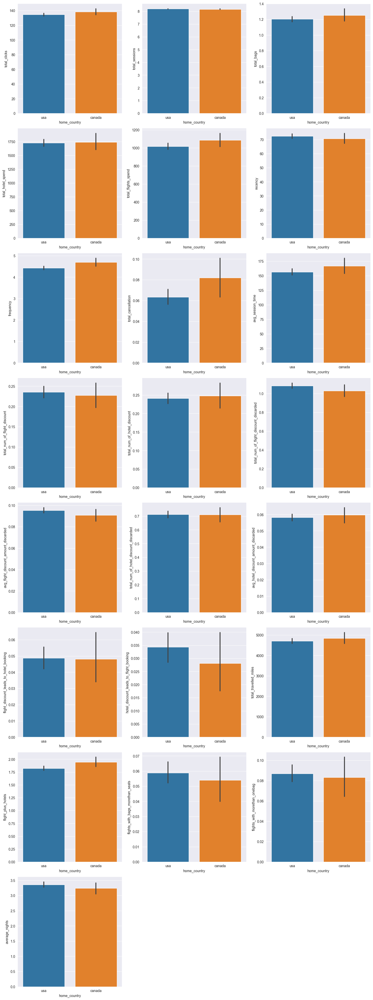

In [25]:

num_columns = len(behavioral_features)
num_rows = int(num_columns / 3) + 1

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))

for i, col in enumerate(df[behavioral_features].columns):
    row_index = i // 3
    col_index = i % 3
    if row_index < num_rows:  # Ensure we're within the bounds of the subplot grid
        sns.barplot(data=df, x='home_country', y=col, ax=axes[row_index, col_index])

fig.delaxes(ax=axes[7,2])
fig.delaxes(ax=axes[7,1])

plt.tight_layout()
plt.show()

##### Notable Observations:

- Canada has a slightly higher average total clicks. The number of sessions does not seem to have a discrepancy between the two countries.

- Canada has a slightly higher average for total_bags.

- Both countries have almost the same average for hotel spending, while Canada has a higher average for flight spending. It's noteworthy that the average for hotel spend is higher than the average for flight spend for both countries.

- While recency shows a slight advantage for the USA, the average frequency is higher for Canada.

- Canada has a noticeably higher average for total cancellation, although with more fluctuation, as the error bar is larger for Canada.

- Canada has a slight higher avg_session_time.

- The difference between the two countries in total number of flight discounts and total number of hotel discounts is minimal, with a slightly higher fluctuation observed for Canada in both categories. However, the average for total number of flight discounts is lower than the total number of hotel discounts.

- On average, there are approximately 1.5 flight discounts discarded for the USA and 1.2 for Canada, while both countries have around 0.7 hotel discount discarded.

- On average, the discarded flight discount rate for the USA is 9.5 percent, while it is 9 percent for Canada. In contrast, the discarded hotel discount rate is less than 6 percent for both countries.

- For both countries, less than 5 percent of the flight discounts resulted in hotel bookings instead of flight bookings. Additionally, for the USA, less than 3.5 percent of the hotel discounts led to flight bookings instead of hotel bookings, while for Canada, it's about 2.7 percent.

- Canada exhibits a higher average of flight plus hotel bookings compared to the USA, and it also boasts a higher average total miles traveled.

- Canada has a lower average for bags per person compared to the number of seats, and a lower average for flights with more than one bag. However, Canada exhibits a higher fluctuation on both metrics.

- Canada has a lower average total nights.






In [26]:
gender_mapping = {'M': 1, 'F': 0,'O':2}
df['gender_encoded'] = df['gender'].map(gender_mapping)
df.drop(columns='gender',inplace=True)
demographic_features=['has_children','married','gender_encoded']

In [27]:
df.groupby('home_country')[demographic_features].value_counts(normalize=True)*100

home_country  has_children  married  gender_encoded
canada        0             0        0                 38.921454
                            1        0                 22.743259
              1             1        0                 13.950762
                            0        0                 13.012896
              0             0        1                  5.275498
                            1        1                  2.461899
              1             1        1                  1.992966
                            0        1                  1.641266
usa           0             0        0                 35.936030
                            1        0                 24.153340
              1             1        0                 15.616181
                            0        0                 12.793979
              0             0        1                  5.079962
                            1        1                  2.328316
              1             1        1

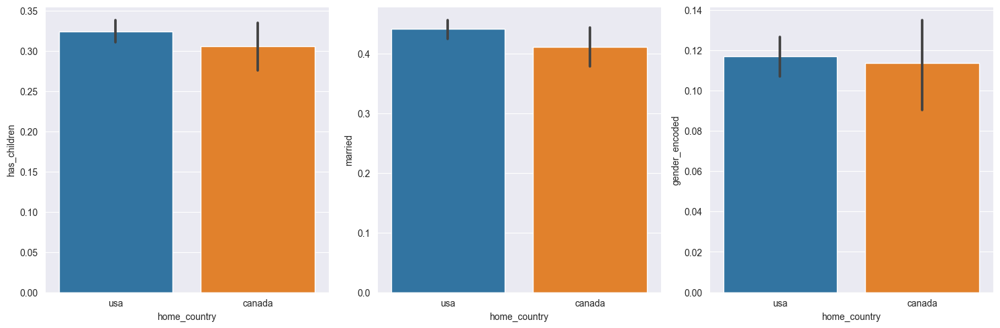

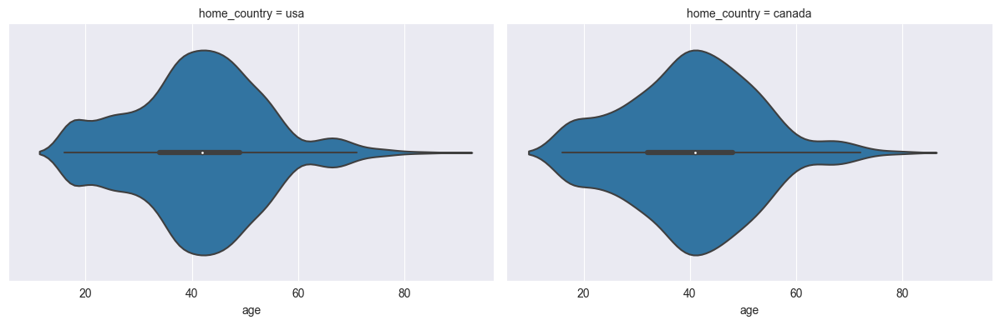

In [28]:
# Set up the subplot grid
fig, axes = plt.subplots(nrows=1, ncols=len(demographic_features), figsize=(15, 5))

# Iterate over each demographic feature and create a countplot
for i, col in enumerate(demographic_features):
    sns.barplot(data=df, x='home_country', y=col,estimator='mean', ax=axes[i])

plt.tight_layout()
plt.show()
# Set up the FacetGrid
g = sns.FacetGrid(df, col="home_country", col_wrap=4, height=4, aspect=1.5)

# Map the age distribution plot onto each country subplot
g.map(sns.violinplot, 'age', bins=10, kde=True)

plt.show()

##### Notable Observations:

- Canada has a lower number of married clients and clients with children, while the gender distribution is nearly the same, with a higher fluctuation observed for Canada.

- The age distribution for the USA is shifting towards the median age, indicating a convergence of ages around the middle of the distribution, whereas for Canada, the age distribution remains relatively stable.

In [29]:
# Filter the main dataframe based on top and bottom cities
df_top_cities = df[df['home_city'].isin(top_cities['home_city'])]
df_bottom_cities = df[df['home_city'].isin(bottom_cities['home_city'])]

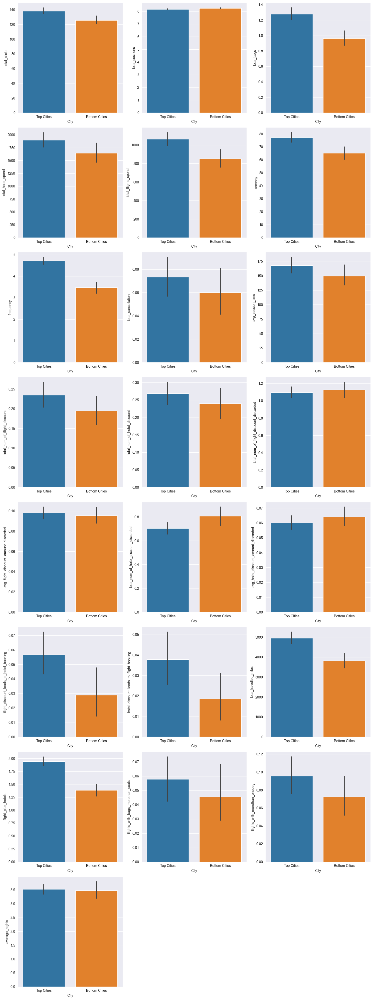

In [30]:
#Behavioral Features for top and bottom cities
num_columns = len(behavioral_features)
num_rows = int(num_columns / 3) + 1

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))

for i, feature in enumerate(behavioral_features):
    row_index = i // 3
    col_index = i % 3
    if row_index < num_rows:  # Ensure we're within the bounds of the subplot grid
        sns.barplot(data=pd.concat([df_top_cities[[feature]].assign(City='Top Cities'), 
                                df_bottom_cities[[feature]].assign(City='Bottom Cities')]), x='City', y=feature, ax=axes[row_index, col_index])


fig.delaxes(ax=axes[7,2])
fig.delaxes(ax=axes[7,1])

plt.tight_layout()
plt.show()

##### Notable Observations:

- While there is no discernible difference in the average total sessions between top and bottom cities, the average total clicks and average session time are notably higher for the top cities.

- The top cities exhibit a higher frequency of discount usage and a lower incidence of discarded discounts compared to the bottom cities.

- Overall, there are no significant observations to note.

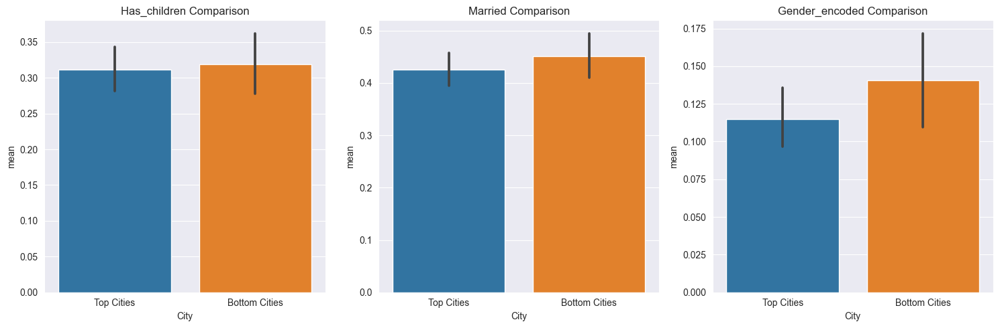

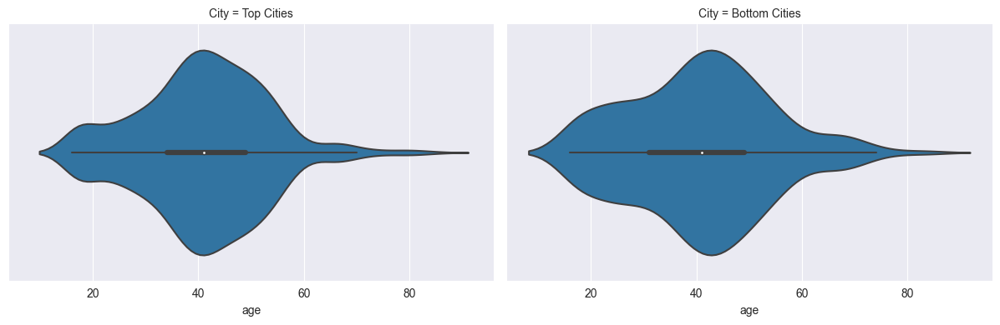

In [31]:
# Set up the subplot grid
fig, axes = plt.subplots(ncols=len(demographic_features), figsize=(15, 5))

# Plot demographic features for top and bottom cities
for i, feature in enumerate(demographic_features):
    sns.barplot(data=pd.concat([df_top_cities[[feature]].assign(City='Top Cities'), 
                                df_bottom_cities[[feature]].assign(City='Bottom Cities')]),
                x='City', y=feature, ax=axes[i])
    axes[i].set_title(f'{feature.capitalize()} Comparison')
    axes[i].set_xlabel('City')
    axes[i].set_ylabel('mean')

plt.tight_layout()
plt.show()
# Set up the FacetGrid
g = sns.FacetGrid(data=pd.concat([df_top_cities[['age']].assign(City='Top Cities'), 
                                df_bottom_cities[['age']].assign(City='Bottom Cities')]), col="City", col_wrap=4, height=4, aspect=1.5)

# Map the age distribution plot onto each country subplot
g.map(sns.violinplot, 'age', bins=20, kde=True)

plt.show()

##### Notable Observations:

- The bottom cities have a higher number of female clients, although the large error bars suggest a considerable level of fluctuation.

- The most notable observation is that bottom cities have a higher number of clients below the age of 40.

- Further analysis could delve into understanding the specific interests of clients below 40 and attempting to align services accordingly.

### Discount Analysis


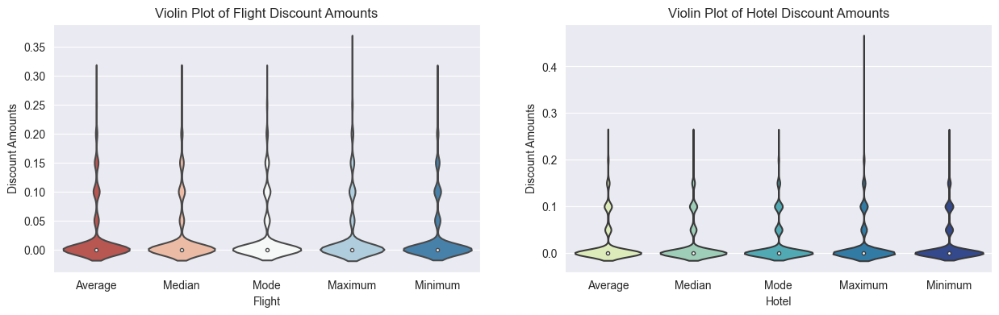

In [32]:
# Set up the figure and axis
# Set up figure and axis
fig, ax = plt.subplots(1,2,figsize=(15,4))
# Create vioolin

sns.violinplot(data=df[['avg_flight_discount_amount', 'median_flight_discount_amount',
                   'mode_flight_discount_amount', 'max_flight_discount_amount',
                   'min_flight_discount_amount']], palette='RdBu',ax=ax[0])

# Set labels and title for the violin plot
ax[0].set_xlabel('Flight')
ax[0].set_ylabel('Discount Amounts')
ax[0].set_title('Violin Plot of Flight Discount Amounts')
ax[0].set_xticklabels(['Average', 'Median', 'Mode', 'Maximum', 'Minimum'])

sns.violinplot(data=df[['avg_hotel_discount_amount',
       'median_hotel_discount_amount', 'mode_hotel_discount_amount',
       'max_hotel_discount_amount', 'min_hotel_discount_amount']], palette='YlGnBu',ax=ax[1])

# Set labels and title for the violin plot
ax[1].set_xlabel('Hotel')
ax[1].set_ylabel('Discount Amounts')
ax[1].set_title('Violin Plot of Hotel Discount Amounts')
ax[1].set_xticklabels(['Average', 'Median', 'Mode', 'Maximum', 'Minimum'])

plt.show()


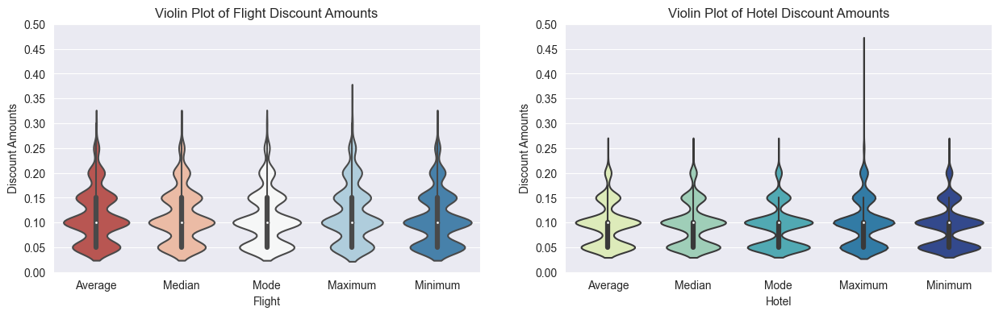

In [33]:
# Plot only clients with discounts.
# Set up the figure and axis
fig, ax = plt.subplots(1, 2, figsize=(15, 4))

# Filter out rows where values are equal to 0 for flight discount amounts
flight_discount_cols = ['avg_flight_discount_amount', 'median_flight_discount_amount',
                        'mode_flight_discount_amount', 'max_flight_discount_amount',
                        'min_flight_discount_amount']
flight_discount_data = df[flight_discount_cols].replace(0, np.nan).dropna(axis=0)

# Create violin plot for flight discount amounts
sns.violinplot(data=flight_discount_data, palette='RdBu', ax=ax[0])

# Set labels and title for the violin plot
ax[0].set_xlabel('Flight')
ax[0].set_ylabel('Discount Amounts')
ax[0].set_title('Violin Plot of Flight Discount Amounts')
ax[0].set_xticklabels(['Average', 'Median', 'Mode', 'Maximum', 'Minimum'])

# Filter out rows where values are equal to 0 for hotel discount amounts
hotel_discount_cols = ['avg_hotel_discount_amount',
                       'median_hotel_discount_amount', 'mode_hotel_discount_amount',
                       'max_hotel_discount_amount', 'min_hotel_discount_amount']
hotel_discount_data = df[hotel_discount_cols].replace(0, np.nan).dropna(axis=0)

# Create violin plot for hotel discount amounts
sns.violinplot(data=hotel_discount_data, palette='YlGnBu', ax=ax[1])

# Set labels and title for the violin plot
ax[1].set_xlabel('Hotel')
ax[1].set_ylabel('Discount Amounts')
ax[1].set_title('Violin Plot of Hotel Discount Amounts')
ax[1].set_xticklabels(['Average', 'Median', 'Mode', 'Maximum', 'Minimum'])

# Set y-axis limits and ticks for both plots
for axis in ax:
    axis.set_ylim(0.05, 0.5)
    axis.set_yticks(np.arange(0, 0.55, 0.05))

    
plt.show()

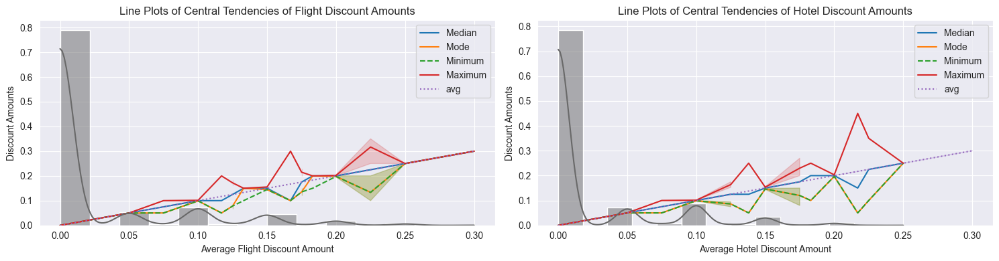

In [34]:
# Set the color palette to 'tab10'
sns.set_palette('tab10')

# Assuming df is your DataFrame
fig, ax = plt.subplots(1, 2, figsize=(15, 4))

# Create line plots for flight-related columns
sns.lineplot(data=df, x='avg_flight_discount_amount', y='median_flight_discount_amount', label='Median', ax=ax[0])
sns.lineplot(data=df, x='avg_flight_discount_amount', y='mode_flight_discount_amount', label='Mode', ax=ax[0])
sns.lineplot(data=df, x='avg_flight_discount_amount', y='min_flight_discount_amount', label='Minimum',linestyle="--", ax=ax[0])
sns.lineplot(data=df, x='avg_flight_discount_amount', y='max_flight_discount_amount', label='Maximum', ax=ax[0])
sns.lineplot(data=df, x='avg_flight_discount_amount', y='avg_flight_discount_amount', label='avg',linestyle="dotted", ax=ax[0])
sns.histplot(df['avg_flight_discount_amount'],stat='probability',ax=ax[0],kde=True,color='dimgrey')


# Set labels and title for flight-related subplot
ax[0].set_xlabel('Average Flight Discount Amount')
ax[0].set_ylabel('Discount Amounts')
ax[0].set_title('Line Plots of Central Tendencies of Flight Discount Amounts')

# Create line plots for hotel-related columns
sns.lineplot(data=df, x='avg_hotel_discount_amount', y='median_hotel_discount_amount', label='Median', ax=ax[1])
sns.lineplot(data=df, x='avg_hotel_discount_amount', y='mode_hotel_discount_amount', label='Mode', ax=ax[1])
sns.lineplot(data=df, x='avg_hotel_discount_amount', y='min_hotel_discount_amount', label='Minimum',linestyle="--", ax=ax[1])
sns.lineplot(data=df, x='avg_hotel_discount_amount', y='max_hotel_discount_amount', label='Maximum', ax=ax[1])
sns.lineplot(data=df, x='avg_flight_discount_amount', y='avg_flight_discount_amount', label='avg',linestyle="dotted", ax=ax[1])
sns.histplot(df['avg_hotel_discount_amount'],stat='probability',ax=ax[1],kde=True,color='dimgrey')


# Set labels and title for hotel-related subplot
ax[1].set_xlabel('Average Hotel Discount Amount')
ax[1].set_ylabel('Discount Amounts')
ax[1].set_title('Line Plots of Central Tendencies of Hotel Discount Amounts')

# Show the plots
plt.tight_layout()
plt.show()

##### Notable Observations:

- Regarding clients solely interested in discounts, although both flights and hotels have the same median discount amount, the 75th percentile of flight discount amounts is 0.15, whereas it is 0.1 for hotels. This suggests that higher flight discounts correlate with increased interest, as compared to hotel discounts which aligns with the previous EDA.

- Overall, the plots suggest that moderate discounts were most common for both flights and hotels, with a smaller number of flights and hotels offered at very high or very low discounts.

#### Correlation Analysis

- Some correlation methods, like Pearson's correlation coefficient, are specifically designed for continuous data and might not be suitable for features with a large proportion of zeros(Zero inflated data and we have Structural zeros: These are zeros that naturally occur in the data and are not influenced by any underlying process.).

- Correlation analysis measures the linear relationship between two variables. However, when a feature has many zeros, it loses its ability to capture the full range of potential values and relationships. This can lead to spurious correlations, meaning a significant correlation coefficient might be observed even if there's no underlying linear relationship between the variables.

- We will use **Kendall's tau rank correlation**, a non-parametric measure that makes no assumptions about the data distribution. While Spearman correlation does not assume a linear relationship, it assumes a monotonic relation. Kendall's tau is suitable for both continuous and ordinal (ranked) data, making it useful when the data may not follow a linear relationship. It is particularly useful when the relationship is expected to be monotonic but not necessarily linear.

In [35]:
# Let's add the average miles travelled column to explore further correlations
df['average_miles_travelled']=np.where(df['total_flight_bookings']>0,df['total_travelled_miles']/df['total_flight_bookings'],0)

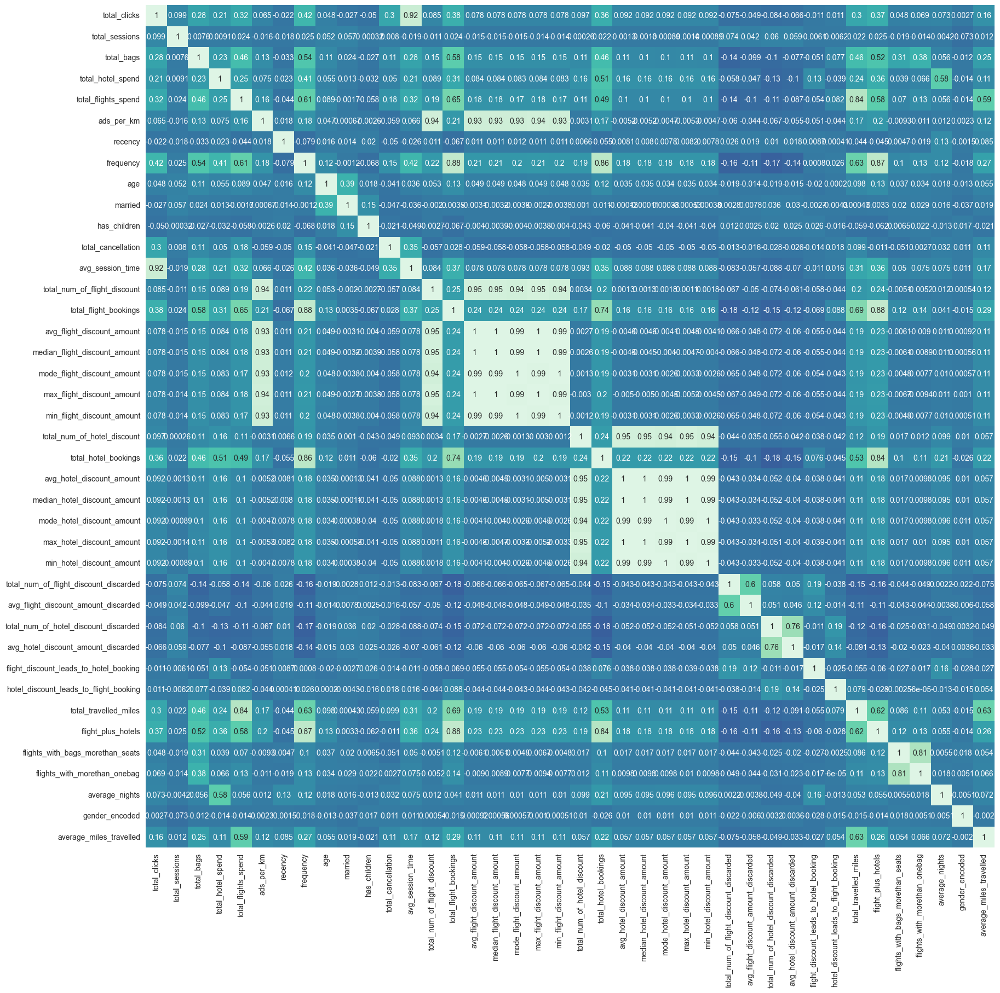

In [36]:
#correlation matrix
corrmat=df.drop(columns='user_id').corr(method='kendall')
# mask = np.triu(np.ones_like(corrmat), k=1)
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat,annot=True, cmap='mako', center=0,cbar=False)
plt.show()

##### Notable Observations:

- The total number of clicks (avg_session_time) demonstrates a moderate relationship with total cancellations, as well as a moderate correlation with the total bookings for both flights and hotels, and a moderate relationship with total_flight_spend. Conversely, it exhibits a weak relationship with total_hotel_spend. Additionally, total sessions have no effect on bookings.

- The total number of bags exhibits a moderate relationship with flight_plus_hotel.

- Total hotel spend demonstrates a moderate correlation with flight_plus_hotel. Additionally, total flight spend has a moderate correlation with average miles traveled, flight_plus_hotel (stronger than total hotel spend), and total bags.

- Age exhibits a moderate correlation with being married.

- Total cancellations exhibit a moderater relationship with average session time and total clicks.

- The total number of flight discounts exhibits a strong relationship with both the central tendencies of discount amounts and ads_per_km (amount of $ saved per mile). 

- The total number of hotel discounts demonstrates a strong relationship with the central tendencies of discount amounts.

- The total number of hotel and flight bookings shows a strong relationship.

- 

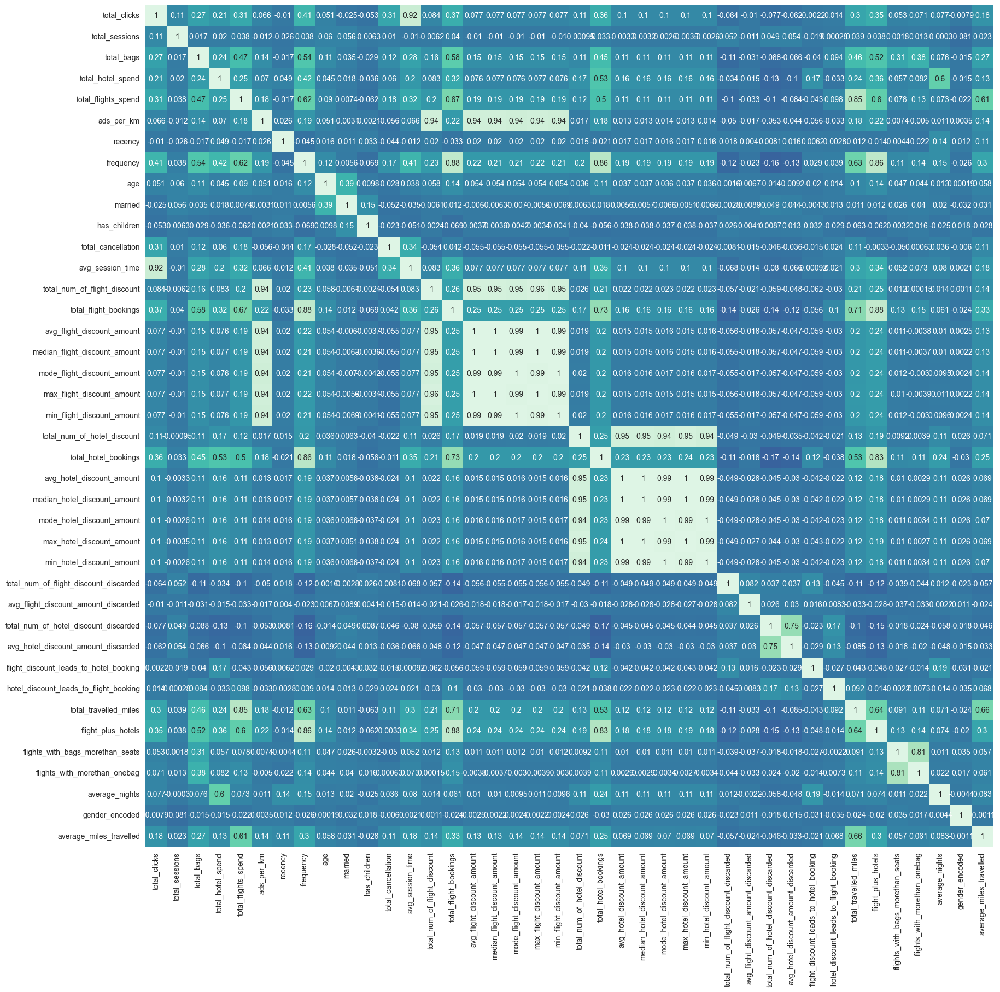

In [37]:
#correlation matrix
corrmat1=df[(df.total_num_of_flight_discount_discarded>0)].drop(columns='user_id').corr('kendall')
# mask = np.triu(np.ones_like(corrmat), k=1)
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat1,annot=True, cmap='mako', center=0,cbar=False)
plt.show()


In [38]:
df.describe()

,user_id,total_clicks,total_sessions,total_bags,total_hotel_spend,total_flights_spend,ads_per_km,recency,frequency,age,married,has_children,total_cancellation,avg_session_time,total_num_of_flight_discount,total_flight_bookings,avg_flight_discount_amount,median_flight_discount_amount,mode_flight_discount_amount,max_flight_discount_amount,min_flight_discount_amount,total_num_of_hotel_discount,total_hotel_bookings,avg_hotel_discount_amount,median_hotel_discount_amount,mode_hotel_discount_amount,max_hotel_discount_amount,min_hotel_discount_amount,total_num_of_flight_discount_discarded,avg_flight_discount_amount_discarded,total_num_of_hotel_discount_discarded,avg_hotel_discount_amount_discarded,flight_discount_leads_to_hotel_booking,hotel_discount_leads_to_flight_booking,total_travelled_miles,flight_plus_hotels,flights_with_bags_morethan_seats,flights_with_morethan_onebag,average_nights,gender_encoded,average_miles_travelled
count,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000,5105.000000
mean,546169.495005,135.126347,8.186876,1.211557,1728.451126,1028.546039,0.002110,72.207444,4.472086,41.059745,0.436827,0.321058,0.066405,158.252174,0.233888,2.116748,0.023805,0.023786,0.022977,0.024672,0.022958,0.242116,2.222527,0.020463,0.020451,0.019755,0.021185,0.019755,1.074829,0.094475,0.711459,0.058507,0.048580,0.033301,4731.939400,1.843487,0.057982,0.086386,3.335775,0.116552,1968.052878
std,64702.298613,59.908926,0.436779,1.208765,2067.930109,1138.885323,0.005861,55.211795,2.743554,12.371049,0.496042,0.466929,0.252142,189.816336,0.480566,1.431455,0.052135,0.052111,0.050796,0.054554,0.050747,0.490654,1.383910,0.043606,0.043563,0.042271,0.045885,0.042271,0.969703,0.088480,0.800908,0.068785,0.223059,0.182684,4158.260727,1.359250,0.237887,0.290559,2.980219,0.326366,1895.920589
min,94883.000000,33.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,0.000000,0.000000,0.000000,31.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,517622.000000,99.000000,8.000000,0.000000,402.000000,313.910000,0.000000,23.000000,2.000000,34.000000,0.000000,0.000000,0.000000,90.875000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1603.079962,1.000000,0.000000,0.000000,1.500000,0.000000,1013.798367
50%,540698.000000,124.000000,8.000000,1.000000,1133.000000,797.380000,0.000000,61.000000,4.000000,41.000000,0.000000,0.000000,0.000000,112.750000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.100000,1.000000,0.050000,0.000000,0.000000,4087.943811,2.000000,0.000000,0.000000,2.670000,0.000000,1841.446788
75%,575500.000000,153.000000,8.000000,2.000000,2340.000000,1370.940000,0.000000,119.000000,6.000000,49.000000,1.000000,1.000000,0.000000,140.500000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.150000,1.000000,0.100000,0.000000,0.000000,6834.603925,3.000000,0.000000,0.000000,4.500000,0.000000,2549.745301
max,844489.000000,642.000000,12.000000,9.000000,28114.000000,15334.040000,0.088529,205.000000,14.000000,88.000000,1.000000,1.000000,2.000000,2025.125000,4.000000,7.000000,0.300000,0.300000,0.300000,0.350000,0.3000

<Figure size 1800x1000 with 0 Axes>

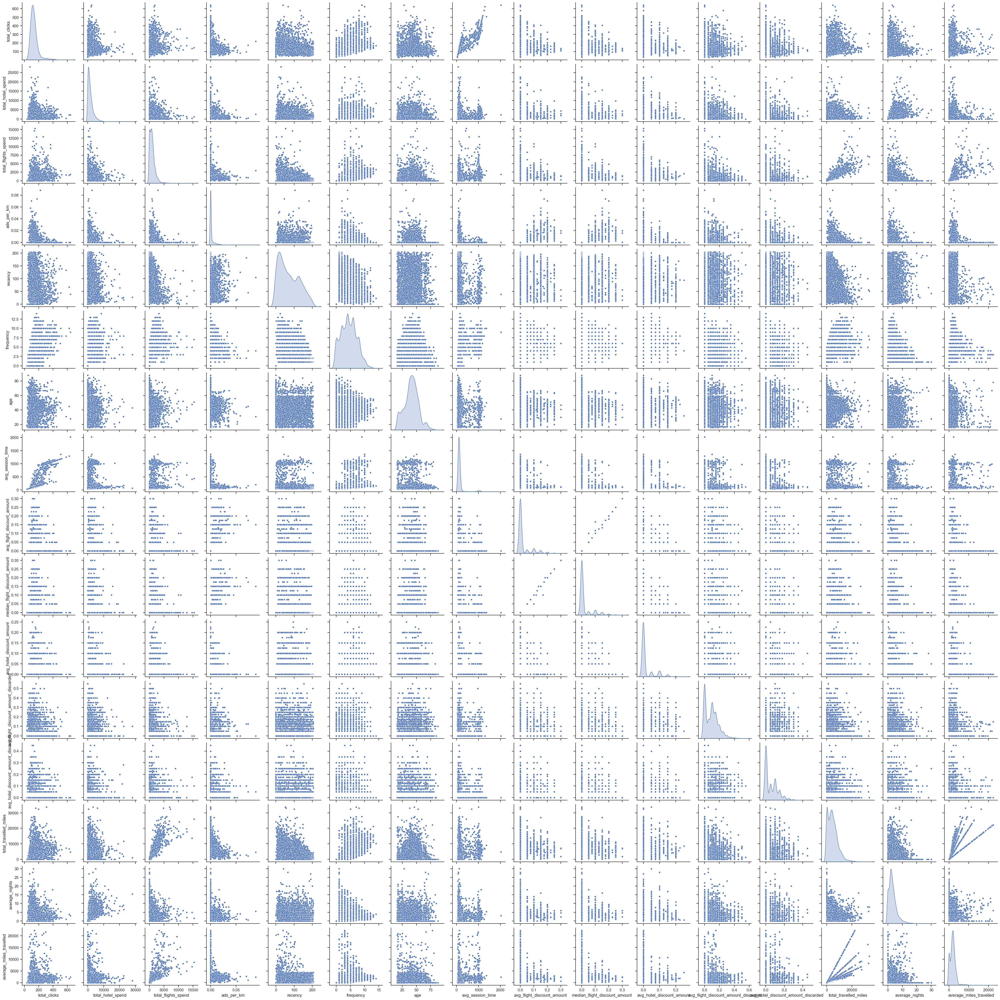

In [39]:
pair_plot_cols=[f for f in df.drop(columns='user_id').select_dtypes(exclude='object').columns if df[f].nunique()>10]
# custom_palette = ["#4575b4", "#91bfdb", "#e0f3f8", "#fee08b", "#d73027"]  # Blue to red
# sns.set_palette(custom_palette)
sns.set(font_scale=1)
plt.figure(figsize=(18, 10))
sns.set(style="ticks", color_codes=True)
sns.pairplot(data=df, vars=pair_plot_cols,diag_kind='kde', 
        kind='scatter',
        plot_kws={'s': 20},
        palette='tab10')
plt.show()